In [91]:
import numpy as np
from pathlib import Path
import cv2
import matplotlib.pyplot as plt

In [9]:
pic_path = Path('data/pic/sample')
!ls {pic_path}

LED_correct_black_16.JPG  LED_correct_wood_37.JPG  LED_correct_wood_8.JPG
LED_correct_black_6.JPG   LED_correct_wood_48.JPG


In [118]:
filenames = ['LED_correct_black_16.JPG','LED_correct_wood_37.JPG', 'LED_correct_wood_8.JPG',
             'LED_correct_black_6.JPG', 'LED_correct_wood_48.JPG']
filepaths = []
for filename in filenames:
    filepaths.append(pic_path / filename)
    
images = []
for filepath in filepaths:
    images.append(plt.imread(filepath))

In [5]:
def get_blurr(im, threshold = 175):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY) # transform image to grayscale, since coloration is not of interest
    blurr = cv2.Laplacian(gray, cv2.CV_64F).var() # the degree of blurrines (or rather sharpness)
    
    test = blurr > threshold
    
    return blurr, test

In [49]:
get_blurr(images[0])

(176.32199064717696, True)

## Gray

In [50]:
im = images[0]

In [54]:
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

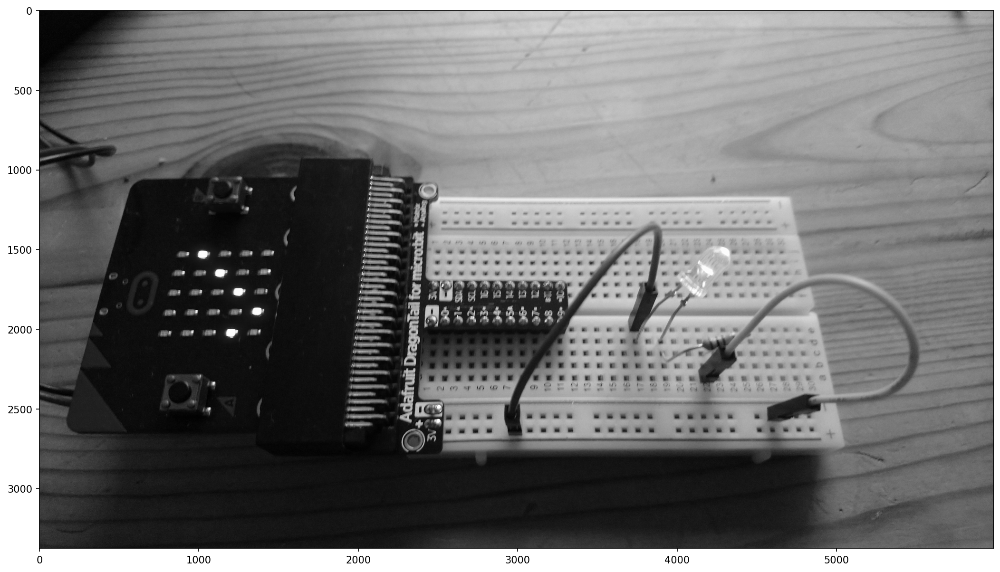

In [16]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(gray, cmap = 'gray')
plt.show()

## Sharpen

In [17]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharp = cv2.filter2D(gray, -1, kernel)

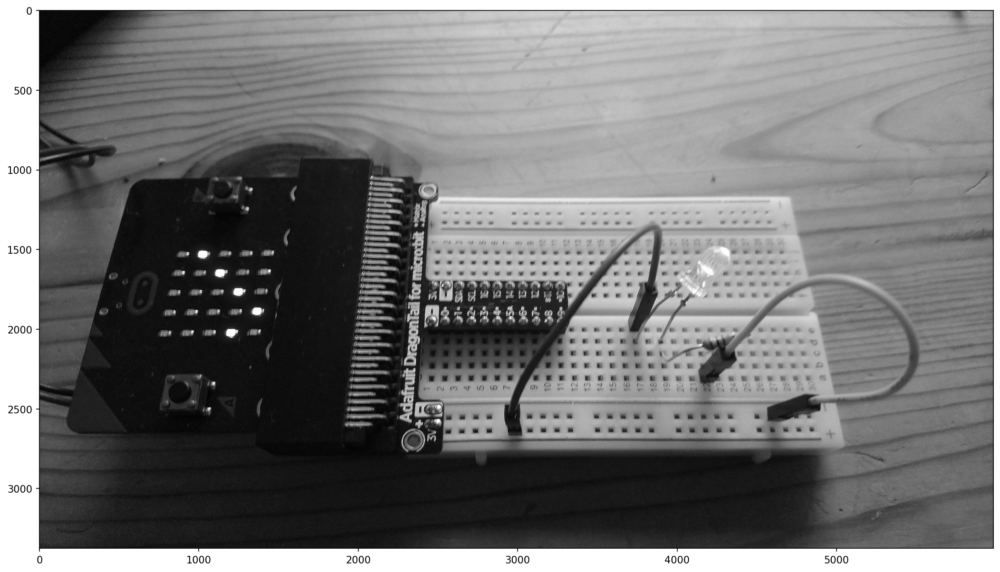

In [18]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(sharp, cmap = 'gray')
plt.show()

### Contrast

In [22]:
enhanced = cv2.equalizeHist(gray)

In [20]:
alpha = 1.5 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)

enhanced = cv2.convertScaleAbs(gray, alpha=alpha, beta=beta)

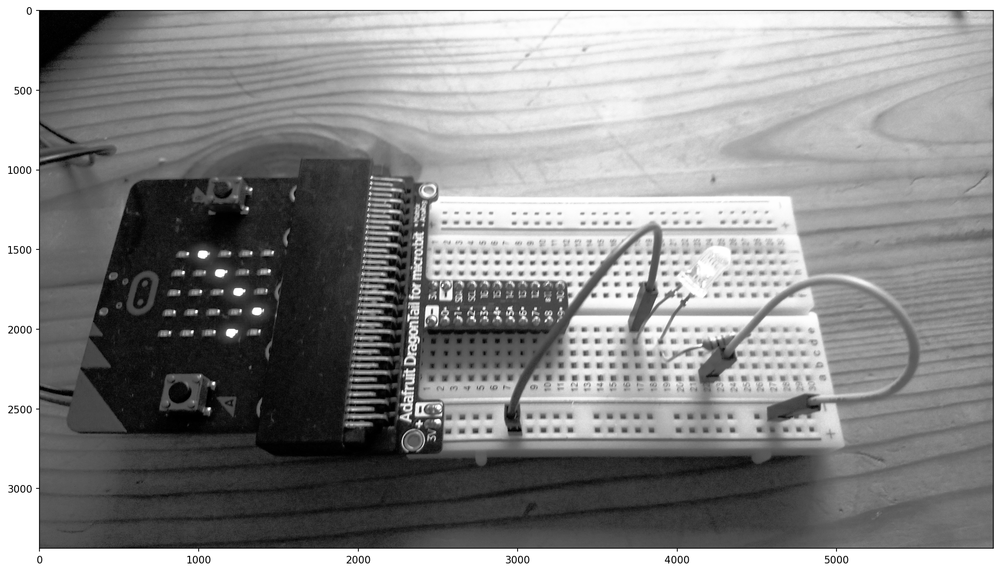

In [23]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(enhanced, cmap = 'gray')
plt.show()

In [40]:
plt.imsave('sizeOfPicture.jpg',enhanced)

### Size

<Figure size 1800x1200 with 0 Axes>

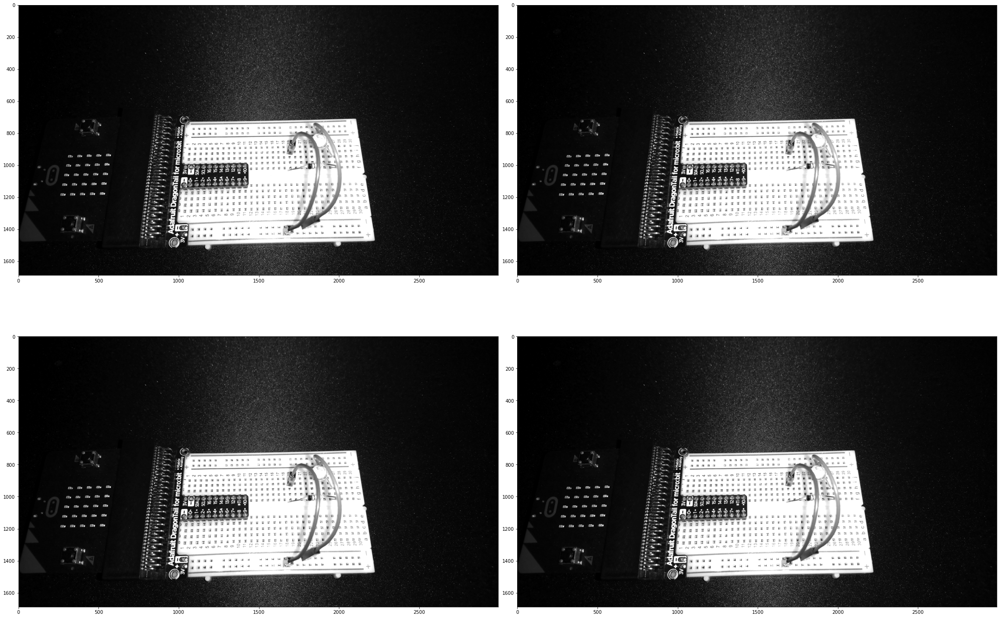

In [63]:
height = gray.shape[0]
width = gray.shape[1]

plt.figure(dpi = 300)
fig, ax = plt.subplots(2,2, figsize = (30,20))
ax = ax.flatten()
plt.tight_layout()

for i in range(4):
    dsize = (int(width / 2.), int(height / 2.))
    output = cv2.resize(enhanced, dsize)
    ax[i].imshow(output, cmap = 'gray')

In [70]:
height = gray.shape[0]
width = gray.shape[1]

In [74]:
width, height = (int(width / 2.), int(height / 2.))
dsize = width,height

output = cv2.resize(enhanced, dsize)
plt.imsave(str(dsize)+'.jpg',output)

Under ~1400x?? its hard to see any detail, cut out relevant space!

### Cut off background

In [26]:
gray

array([[  6,   4,   9, ..., 136, 136, 138],
       [  9,   9,   9, ..., 138, 137, 136],
       [  9,  12,  10, ..., 141, 139, 137],
       ...,
       [ 22,  30,  31, ..., 105, 108, 109],
       [ 36,  37,  34, ..., 103, 106, 106],
       [ 45,  38,  42, ..., 110, 110, 108]], dtype=uint8)

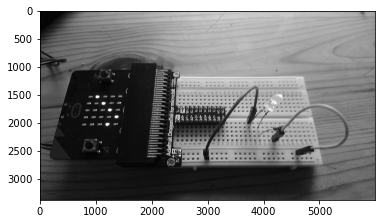

In [27]:
plt.imshow(gray, cmap = 'gray')

In [59]:
len(images)

5

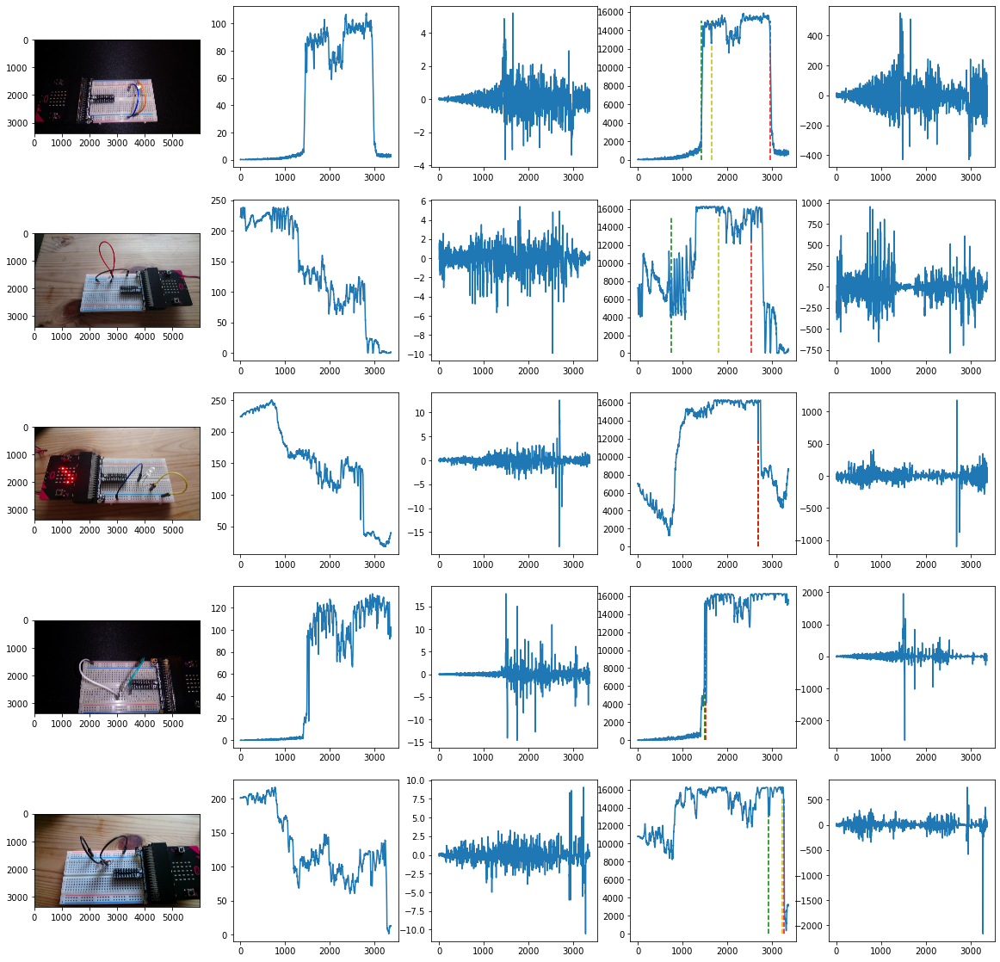

In [182]:
fig, axs = plt.subplots(5, 5, figsize = (20,20))

for i in range(5):
    gray = cv2.cvtColor(images[i],cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    means = np.mean(thresh, axis = 1).flatten()
    variances = np.var(thresh, axis = 1, out = None).flatten()
    means_grad = np.gradient(means)
    var_grad = np.gradient(variances)

    axs[i,0].imshow(images[i], cmap = 'gray')
    axs[i,1].plot(np.arange(gray.shape[0]), means)
    axs[i,2].plot(np.arange(gray.shape[0]), means_grad)
    axs[i,3].plot(np.arange(gray.shape[0]), variances)
    axs[i,3].vlines(x = var_grad.argmin(), ymin = 0., ymax = 15000., colors = ['r'], linestyle = '--', zorder = -10)
    axs[i,3].vlines(x = var_grad.argmax(), ymin = 0., ymax = 15000, colors = ['g'], linestyle = '--', zorder = -11)
    axs[i,3].vlines(x = means_grad.argmax(), ymin = 0., ymax = 15000, colors = ['y'], linestyle = '--', zorder = -12)
    axs[i,4].plot(np.arange(gray.shape[0]), var_grad)

I don't have a good idea how to automatically find the point at which to cut off the background. This could be handled be segregation, or in the picture taking interface (app) later on. For now i have to settle on cutting the pictures manually.